<a href="https://colab.research.google.com/github/lucazappaterra/PhysLab-II---CYGNO/blob/main/PMT_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data and enviroment preparation

In [1]:
!pip install lecroyparser

In [2]:
import lecroyparser
import matplotlib.pyplot as plt
import os

!wget https://media.giphy.com/media/yJFeycRK2DB4c/giphy.gif ;
from IPython.display import Image

#!wget https://github.com/lucazappaterra/PhysLab-II---CYGNO/raw/main/PMT_data_31-03/pmt-1648-dark.zip
#!unzip pmt-1648-dark.zip 

#!wget https://github.com/lucazappaterra/PhysLab-II---CYGNO/raw/main/PMT_data_31-03/pmt-1648-spe.zip
#!unzip pmt-1648-spe.zip

--2022-03-31 20:03:43--  https://media.giphy.com/media/yJFeycRK2DB4c/giphy.gif
Resolving media.giphy.com (media.giphy.com)... 199.232.194.2, 199.232.198.2
Connecting to media.giphy.com (media.giphy.com)|199.232.194.2|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1043578 (1019K) [image/gif]
Saving to: ‘giphy.gif’

giphy.gif           100%[===================>]   1019K  --.-KB/s    in 0.03s   

2022-03-31 20:03:43 (37.0 MB/s) - ‘giphy.gif’ saved [1043578/1043578]



In [3]:
# imo it could be smarter to import all data at once, it's just ~5 Mb
!wget https://github.com/lucazappaterra/PhysLab-II---CYGNO/raw/main/Data.zip
!unzip Data.zip

--2022-03-31 20:03:43--  https://github.com/lucazappaterra/PhysLab-II---CYGNO/raw/main/Data.zip
Resolving github.com (github.com)... 140.82.121.3
Connecting to github.com (github.com)|140.82.121.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/lucazappaterra/PhysLab-II---CYGNO/main/Data.zip [following]
--2022-03-31 20:03:43--  https://raw.githubusercontent.com/lucazappaterra/PhysLab-II---CYGNO/main/Data.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3304151 (3.2M) [application/zip]
Saving to: ‘Data.zip’

Data.zip            100%[===================>]   3.15M  --.-KB/s    in 0.05s   

2022-03-31 20:03:44 (62.8 MB/s) - ‘Data.zip’ saved [3304151/3304151]

Archive:  Data.zip
   creating: Data

In [4]:
# dark current data path
path_dark='Data/20220331-PMT/pmt-1648/1648-dark/'
files_dark = os.listdir(path_dark)

# single (?) photoelectron current data path
path_spe='Data/20220331-PMT/pmt-1648/1648-spe/'
files_spe = os.listdir(path_spe)

# impulsator data paths
path_imp7='Data/20220331-PMT/pmt-1648/1648-imp7/'
files_imp7 = os.listdir(path_imp7)

path_imp75='Data/20220331-PMT/pmt-1648/1648-imp7.5/'
files_imp75 = os.listdir(path_imp75)

path_imp8='Data/20220331-PMT/pmt-1648/1648-imp8/'
files_imp8 = os.listdir(path_imp8)

No DS_Store!


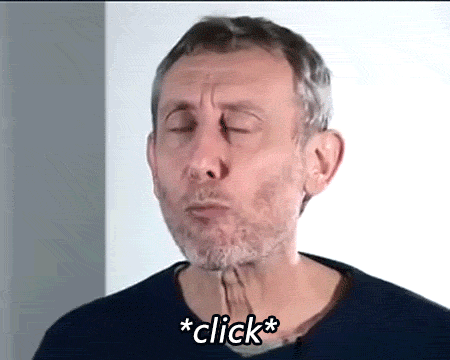

In [5]:
if not ((files_dark=='.DS_Store')&(files_spe=='.DS_Store')&(files_imp7=='.DS_Store')&(files_imp75=='.DS_Store')&(files_imp8=='.DS_Store')): 
    with open('giphy.gif','rb') as f:
        print('No DS_Store!')
        display(Image(data=f.read(), format='png'))

# Dark Current Visualization

In [6]:
from scipy import signal
import numpy as np
peaks = np.zeros(len(files_dark))
peakpos = np.zeros(len(files_dark))
usample=0
t_dark = np.zeros(shape=(len(files_dark), 252))
v_dark = np.zeros(shape=(len(files_dark), 252))
for i,filename in enumerate(files_dark):
    #print(i,filename)
    f = open(path_dark+filename, 'rb')
    data = lecroyparser.ScopeData(data = f.read(), sparse=usample) # sparse limits the number of samples in the output array, 
                                                                   # we can't go further than the "WaveArrayCount"
    t_dark[i] = data.x
    v_dark[i] = data.y
    #print(t[i])
    # let's find and print the number of peaks in the batch
    #peaks[i] = len(signal.find_peaks(-1*data.y, prominence=0.015)[0])
    #peakpos[i] = signal.find_peaks(-1*data.y, prominence=0.015)[0]
    #print(f"Peaks' index: {peakpos[i]}")
    #print(f'Peaks in this batch: {peaks[i]}\n')

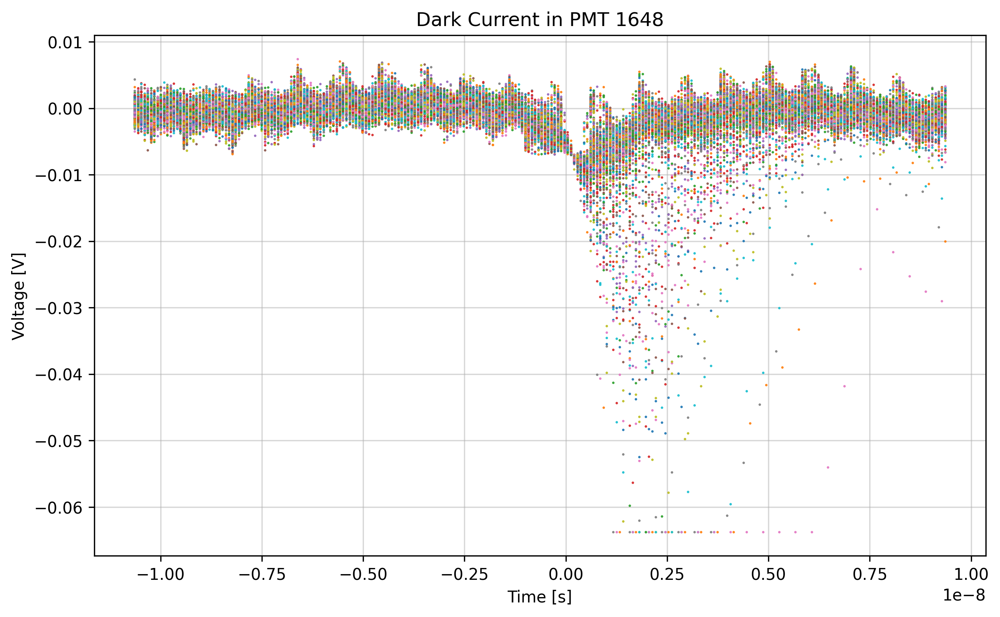

In [7]:
mean = np.zeros(200)
plt.figure(figsize=(10,6), dpi=300)
plt.title('Dark Current in PMT 1648')
plt.xlabel('Time [s]')
plt.ylabel('Voltage [V]')

for k,filename in enumerate(files_dark):
    plt.plot(t_dark[k][80:130], v_dark[k][80:130], '.', linewidth=.5, markersize=1, label=filename)
    plt.grid(alpha=.5)


# Single (?) Photoelectron Current Visualization

In [8]:
usample=0
peaks = np.zeros(len(files_spe))
peakpos = np.zeros(len(files_spe))
t_spe = np.zeros(shape=(len(files_spe), 127))
v_spe = np.zeros(shape=(len(files_spe), 127))
for i,filename in enumerate(files_spe):
    #print(i,filename)
    f = open(path_spe+filename, 'rb')
    data = lecroyparser.ScopeData(data = f.read(), sparse=usample) # sparse limits the number of samples in the output array, 
                                                                   # we can't go further than the "WaveArrayCount"
    t_spe[i] = data.x
    v_spe[i] = data.y

    # let's find and print the number of peaks in the batch
    #peaks[i] = len(signal.find_peaks(-1*data.y, prominence=0.015)[0])
    #peakpos[i] = signal.find_peaks(-1*data.y, prominence=0.015)[0]
    #print(f"Peaks' index: {peakpos[i]}")
    #print(f'Peaks in this batch: {peaks[i]}\n')

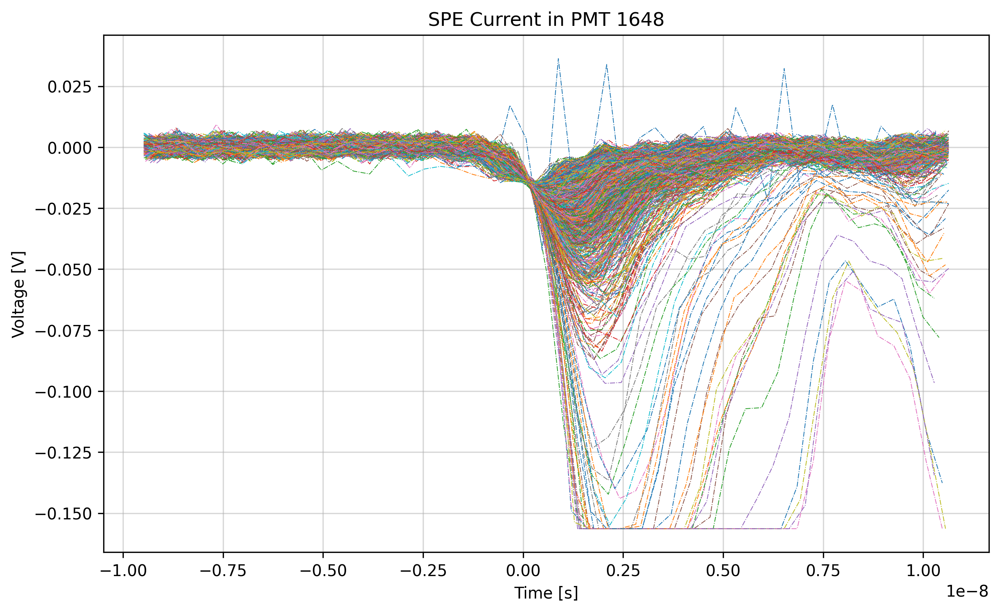

In [9]:
mean = np.zeros(200)
plt.figure(figsize=(10,6), dpi=300)
plt.title('SPE Current in PMT 1648')
plt.xlabel('Time [s]')
plt.ylabel('Voltage [V]')

for k,filename in enumerate(files_dark):
    plt.plot(t_spe[k][30:80], v_spe[k][30:80], '-.', linewidth=.5, markersize=1, label=filename)
    plt.grid(alpha=.5)

# Impulsator Data

## 7

In [10]:
usample=0
peaks = np.zeros(len(files_imp7))
peakpos = np.zeros(len(files_imp7))
t_imp7 = np.zeros(shape=(len(files_imp7), 502))
v_imp7 = np.zeros(shape=(len(files_imp7), 502))
for i,filename in enumerate(files_imp7):
    #print(i,filename)
    f = open(path_imp7+filename, 'rb')
    data = lecroyparser.ScopeData(data = f.read(), sparse=usample) # sparse limits the number of samples in the output array, 
                                                                   # we can't go further than the "WaveArrayCount"
    t_imp7[i] = data.x
    v_imp7[i] = data.y
    
    # let's find and print the number of peaks in the batch
    #peaks[i] = len(signal.find_peaks(-1*data.y, prominence=0.015)[0])
    #peakpos[i] = signal.find_peaks(-1*data.y, prominence=0.015)[0]
    #print(f"Peaks' index: {peakpos[i]}")
    #print(f'Peaks in this batch: {peaks[i]}\n')

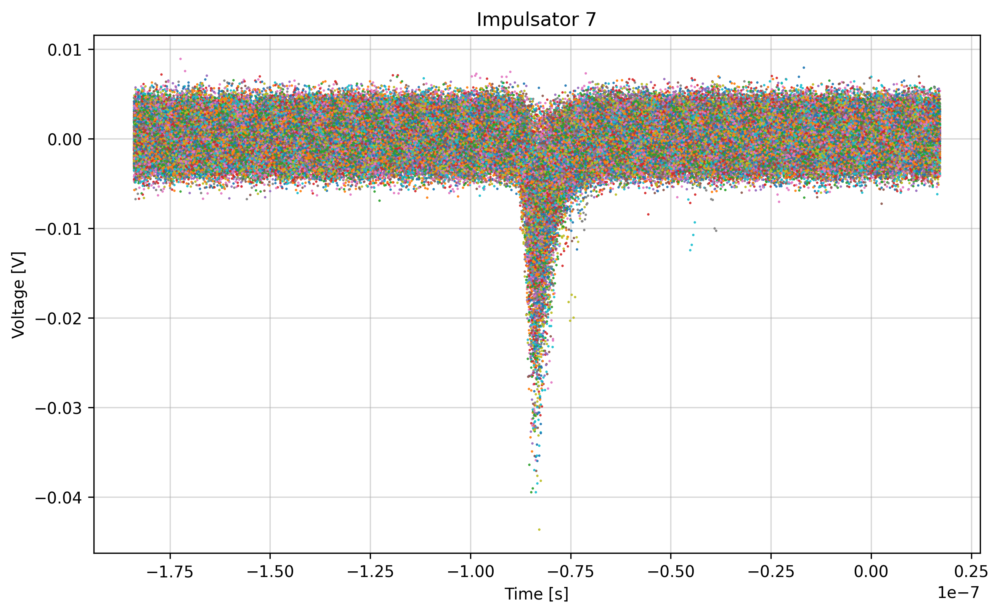

In [11]:
mean = np.zeros(200)
plt.figure(figsize=(10,6), dpi=300)
plt.title('Impulsator 7')
plt.xlabel('Time [s]')
plt.ylabel('Voltage [V]')

for k,filename in enumerate(files_imp7):
    plt.plot(t_imp7[k], v_imp7[k], '.', linewidth=.5, markersize=1, label=filename)
    plt.grid(alpha=.5)

## 7.5

In [12]:
usample=0
peaks = np.zeros(len(files_imp75))
peakpos = np.zeros(len(files_imp75))
t_imp75 = np.zeros(shape=(len(files_imp75), 502))
v_imp75 = np.zeros(shape=(len(files_imp75), 502))
for i,filename in enumerate(files_imp75):
    #print(i,filename)
    f = open(path_imp75+filename, 'rb')
    data = lecroyparser.ScopeData(data = f.read(), sparse=usample) # sparse limits the number of samples in the output array, 
                                                                  # we can't go further than the "WaveArrayCount"
    t_imp75[i] = data.x
    v_imp75[i] = data.y
    
    # let's find and print the number of peaks in the batch
    #peaks[i] = len(signal.find_peaks(-1*data.y, prominence=0.015)[0])
    #peakpos[i] = signal.find_peaks(-1*data.y, prominence=0.015)[0]
    #print(f"Peaks' index: {peakpos[i]}")
    #print(f'Peaks in this batch: {peaks[i]}\n')

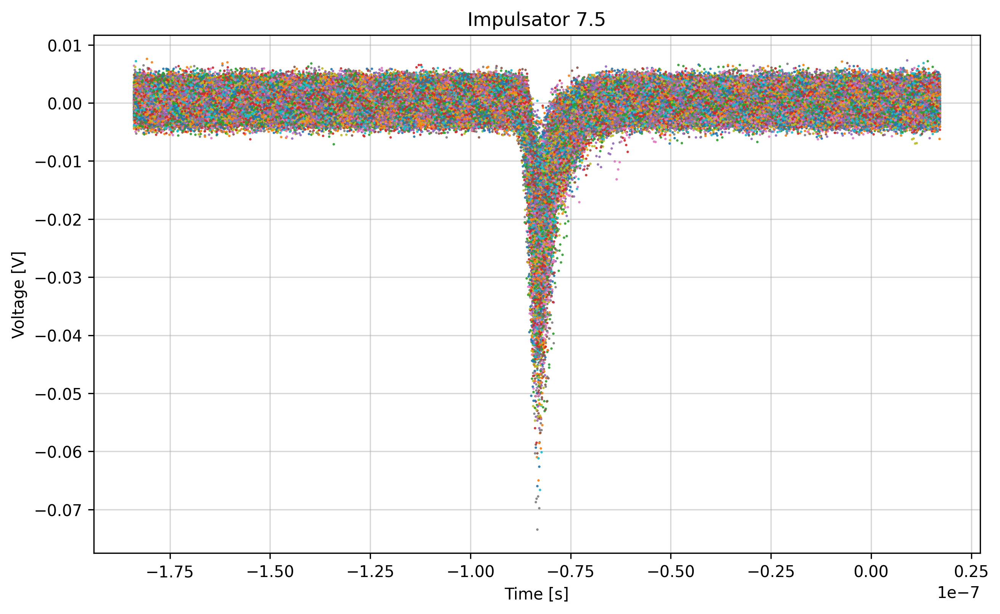

In [13]:
mean = np.zeros(200)
plt.figure(figsize=(10,6), dpi=300)
plt.title('Impulsator 7.5')
plt.xlabel('Time [s]')
plt.ylabel('Voltage [V]')

for k,filename in enumerate(files_imp75):
    plt.plot(t_imp75[k], v_imp75[k], '.', linewidth=.5, markersize=1, label=filename)
    plt.grid(alpha=.5)

## 8

In [15]:
usample=0
peaks = np.zeros(len(files_imp8))
peakpos = np.zeros(len(files_imp8))
t_imp8 = np.zeros(shape=(len(files_imp8), 502))
v_imp8 = np.zeros(shape=(len(files_imp8), 502))
for i,filename in enumerate(files_imp8):
    #print(i,filename)
    f = open(path_imp8+filename, 'rb')
    data = lecroyparser.ScopeData(data = f.read(), sparse=usample) # sparse limits the number of samples in the output array, 
                                                                  # we can't go further than the "WaveArrayCount"
    t_imp8[i] = data.x
    v_imp8[i] = data.y
    
    # let's find and print the number of peaks in the batch
    #peaks[i] = len(signal.find_peaks(-1*data.y, prominence=0.015)[0])
    #peakpos[i] = signal.find_peaks(-1*data.y, prominence=0.015)[0]
    #print(f"Peaks' index: {peakpos[i]}")
    #print(f'Peaks in this batch: {peaks[i]}\n')

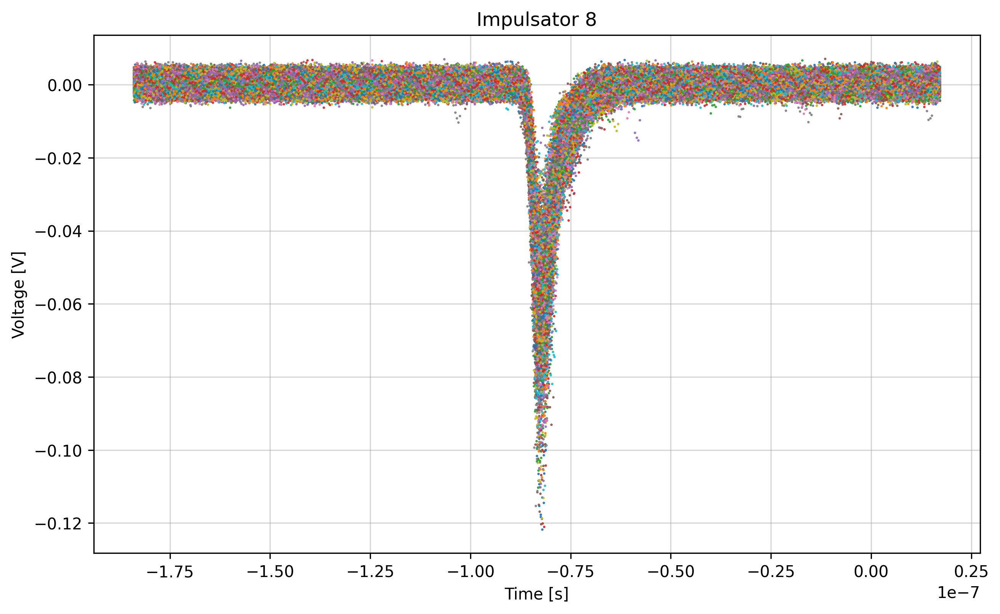

In [16]:
mean = np.zeros(200)
plt.figure(figsize=(10,6), dpi=300)
plt.title('Impulsator 8')
plt.xlabel('Time [s]')
plt.ylabel('Voltage [V]')

for k,filename in enumerate(files_imp8):
    plt.plot(t_imp8[k], v_imp8[k], '.', linewidth=.5, markersize=1, label=filename)
    plt.grid(alpha=.5)